In [34]:
import xarray as xr
import xgcm
import numpy as np
import xroms
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.patches import ConnectionPatch
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
import matplotlib.colors as colors
from glob import glob
from dask.diagnostics import ProgressBar
import dask
dask.config.set(**{'array.slicing.split_large_chunks': True})

import cmocean as cm
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy as cartopy
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from scipy.io import loadmat
plt.rcParams['text.usetex'] = True
plt.rcParams.update({'font.size': 22})
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'



In [35]:
csal = loadmat('/data/pacific/jacob/WHITESHARKCAFE/Misc/colormap_salinity.mat')
cmapS = csal['cmapS']
cmapS.shape
smap = colors.LinearSegmentedColormap.from_list('SalMap',cmapS, N=204)

## Load and Calculate

In [36]:
chunks={'time':1, 's_rho':10, 's_w':10}
fileprefix = '/data/pacific/jacob/WHITESHARKCAFE/Data/MSHARK_D3/'
# Load History Files
files = sorted(glob(fileprefix+'mshark_his.*.nc'))


chunks={'time':1, 's_rho':10, 's_w':10}
#ds = xroms.open_mfnetcdf(files, chunks, xrargs={'combine':'nested'})
ds = xr.open_mfdataset(files, combine='nested', concat_dim='time', data_vars='minimal', chunks=chunks)

ds = ds.rename(time='ocean_time')
ds, grid = xroms.roms_dataset(ds, Vtransform=2)
    
ds['yearday'] = np.mod(ds.scrum_time/86400, 360)

# Load PV diagnostics
files = glob(fileprefix+'mshark_diapv*.nc')
dspv = xr.open_mfdataset(files, combine='nested', concat_dim='time', data_vars='minimal')
dspv = dspv.rename(time='ocean_time')

# Load Momentum diagnostics
files = glob(fileprefix+'mshark_diaM*.nc')
dsm = xr.open_mfdataset(files, combine='nested', concat_dim='time', data_vars='minimal')
dsm = dsm.rename(time='ocean_time')

In [4]:
# Calculate diagnostics
dayslice = slice(2*30, 2*30+12*30) # Sept 1 through Sept 1st

ds = ds.isel(ocean_time=dayslice)
dspv = dspv.isel(ocean_time=dayslice)
dsm = dsm.isel(ocean_time=dayslice)
ds.xroms.vort

ds['lat_psi'] = ds.xroms.to_grid('lat_rho', 'psi')
ds['lon_psi'] = ds.xroms.to_grid('lon_rho', 'psi')

## NEW OVERVIEW PLOT
This plot has the combined annual cycle plus z-slices

<ipython-input-32-7f29586890aa>:145: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axs.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=tse)[:,:,xi],ds.salt.isel(ocean_time=tse)[:,:,xi], vmin=slow, vmax=shigh, cmap=smap, rasterized=raster)
<ipython-input-32-7f29586890aa>:163: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axq.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=tse)[:,:,xi],PV[:,:,xi]*1e8, vmin=pvllim, vmax=pvhli

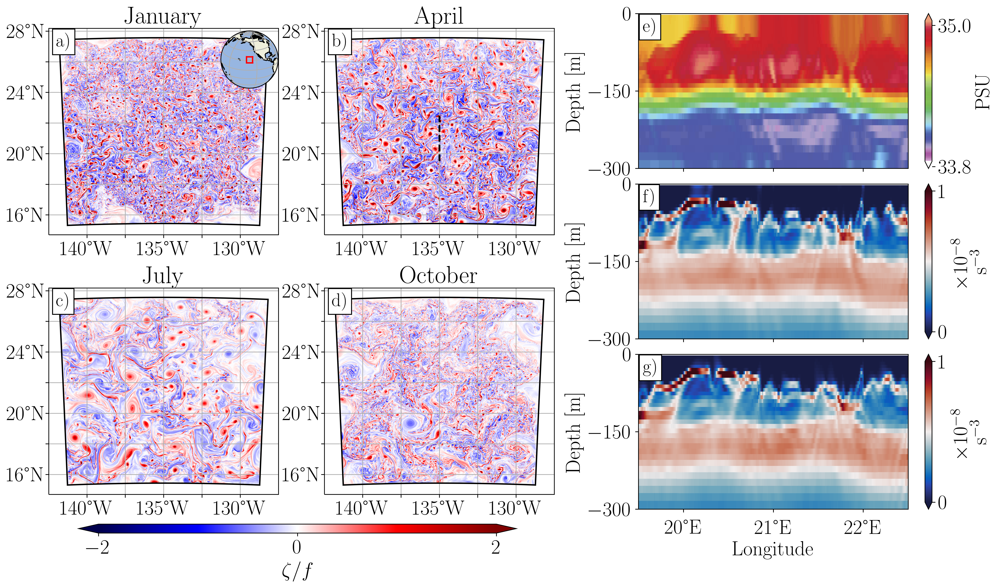

In [32]:
######## VARIABLES USED IN THIS PLOT ############
surfzeta = ds.xroms.to_grid('vort', 'rho', 's_w').isel(s_w=-2)

tse = np.argmin(np.abs(ds.yearday.values-(3.5*30)))
ZETAE = ds.xroms.to_grid('vort', 'rho', 's_w').isel(s_w=-2, ocean_time=tse)[1:-1,1:-1]
PV = ds.xroms.ertel.isel(ocean_time=tse)
dbdz = xroms.to_grid(xroms.ddz(ds.xroms.buoyancy,grid, sboundary='fill', sfill_value=np.nan),grid, scoord='s_rho')
PPV = ds.f*dbdz.isel(ocean_time=tse)

########      PLOT FORMATTING     ############
pvllim = 0
pvhlim = 1
xi=np.argmin(np.abs(ds.lon_psi.values[100,:] +135.))
bmap = cm.cm.balance
xl = 19.5 # Southern limit of slice
xr = 22.5 # Northern limit of slice
slow = 33.8444 # Salinity color limits
shigh = 35.0410
raster = True

########      DEFINE THE FIGURE   ############
fig = plt.figure(figsize=(18,9), dpi=450)
gs0 = fig.add_gridspec(1,2, width_ratios=[1.5,1])
gs00 = gs0[0].subgridspec(2,2) # This is the annual cycle of zeta subplots
gs01 = gs0[1].subgridspec(3,1) # This is the slice subplots

#plt.subplot(gs00[0])
#plt.subplot(gs00[1])
#plt.subplot(gs00[2])
#plt.subplot(gs00[3])
#plt.subplot(gs01[0])
#plt.subplot(gs01[1])
#plt.subplot(gs01[2])

###########################################
######## ANNUAL CYCLE IN ZETA  ############
###########################################
month = [1, 4, 7, 10]
titles = ['January', 'April', 'July', 'October']
annos = ['a', 'b', 'c', 'd']
for i in range(0,4): # Iterate through the choosen months
    ts = np.argmin(np.abs(ds.yearday.values -((month[i]-1)+0.5)*30))#Pick the middle of the month
    ZETA = surfzeta.isel(ocean_time=ts)[1:-1,1:-1]
    axz = plt.subplot(gs00[i], projection=ccrs.PlateCarree())

    if i==1:
        axzeta = axz
    # Make the zeta plot
    im = axz.pcolormesh(ds.lon_psi.values, ds.lat_psi.values, ZETA/ds.f[1:-1,1:-1], vmin=-2, vmax=2, cmap='seismic', rasterized=raster)
    xticks = [-145, -142.5, -140, -137.5, -135, -132.5, -130,-127.5, -125]
    yticks = [16, 18, 20, 22, 24, 26, 28]
    
    #gl = axz.gridlines(draw_labels=True)
    #gl.xlocator = mticker.FixedLocator(xticks)
    #gl.ylocator = mticker.FixedLocator(yticks)
    #gl.xformatter = LONGITUDE_FORMATTER
    #gl.yformatter = LATITUDE_FORMATTER
    
    gl = axz.gridlines(draw_labels=False, xlocs = xticks, ylocs=yticks)
    gl.top_labels = False
    gl.right_labels = False
    axz.set_xticks(xticks, crs=ccrs.PlateCarree())
    axz.set_yticks(yticks, crs=ccrs.PlateCarree())
    axz.set_yticklabels(['16°N','', '20°N','','24°N','','28°N'])
    axz.set_xticklabels(['','','140°W','', '135°W','','130°W','',''])
    axz.tick_params(axis='y', which='major', pad=0)
    
    #axz.add_feature(cfeature.OCEAN, facecolor='1')
    axz.set_title(titles[i], pad=-1)
    axz.text( -142, 27 ,annos[i]+')', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )


    # ADD INSET MAP TO ZETA PLOT
    if i==0:
        ax = inset_axes(axz, width="25%", height="30%", loc=1, borderpad=0.01, axes_class=cartopy.mpl.geoaxes.GeoAxes,
                    axes_kwargs={'facecolor':'lightgrey', 'map_projection':ccrs.Orthographic(-135, 22)})
        ax.add_feature(cfeature.OCEAN, rasterized=raster)
        ax.add_feature(cfeature.LAND, edgecolor='black', rasterized=raster)
        ax.set_global()
        ax.gridlines()

        tf = ccrs.Geodetic()
        ax.plot(ds.lon_rho[-1,:], ds.lat_rho[-1,:],
             color='r', linestyle='-',
             transform=tf,
             ) # TOP

        ax.plot(ds.lon_rho[0,:], ds.lat_rho[0,:],
             color='r', linestyle='-',
             transform=tf,
             ) # BOTTOM

        ax.plot(ds.lon_rho[:,0], ds.lat_rho[:,0],
             color='r', linestyle='-',
             transform=tf,
             ) # LEFT

        ax.plot(ds.lon_rho[:,-1], ds.lat_rho[:,-1],
             color='r', linestyle='-',
             transform=tf,
             ) # RIGHT

    axz.plot(ds.lon_rho[-1,:], ds.lat_rho[-1,:],
             color='k', linestyle='-',
             transform=tf,
             ) # TOP

    axz.plot(ds.lon_rho[0,:], ds.lat_rho[0,:],
             color='k', linestyle='-',
             transform=tf,
             ) # BOTTOM

    axz.plot(ds.lon_rho[:,0], ds.lat_rho[:,0],
             color='k', linestyle='-',
             transform=tf,
             ) # LEFT

    axz.plot(ds.lon_rho[:,-1], ds.lat_rho[:,-1],
             color='k', linestyle='-',
             transform=tf,
             ) # RIGHT

fig.subplots_adjust(bottom=0.05)    
cbar_ax = fig.add_axes([0.15, 0.01, 0.366, 0.015])
cb = fig.colorbar(im, cax=cbar_ax, extend='both', orientation='horizontal', ticks=[-2, 0, 2])
cb.set_label(r'$\zeta/f$')
#plt.subplots_adjust(wspace=0.15, hspace=0.05)
#plt.savefig('AnnualZeta.ps', bbox_inches='tight')
#plt.savefig('../Figures/ZetaCombo.pdf', bbox_inches='tight')

###########################################
######## SLICES THROUGH EDDIES ############
###########################################

axq = plt.subplot(gs01[1])
axf = plt.subplot(gs01[2])
axs = plt.subplot(gs01[0])

# Add the slice indicator to the zeta plot
xli = np.argmin(np.abs(ds.lat_psi.values[:,xi] - xl))
xri = np.argmin(np.abs(ds.lat_psi.values[:,xi] - xr))
axzeta.plot(ds.lon_psi[xli:xri, xi], ds.lat_psi[xli:xri, xi], color='k', linestyle='--', linewidth=2)

# SALINITY PLOT
im = axs.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=tse)[:,:,xi],ds.salt.isel(ocean_time=tse)[:,:,xi], vmin=slow, vmax=shigh, cmap=smap, rasterized=raster)
#saltc = np.linspace(slow, shigh, 60)
#lattile = np.tile(ds.lat_rho.values[:,xi], [ds.s_rho.size, 1])
#im = axs.contourf(lattile, ds.z_rho.isel(ocean_time=tse)[:,:,xi],ds.salt.isel(ocean_time=tse)[:,:,xi], saltc, cmap=smap, extend='both', rasterized=raster)

axs.set_ylim(-300,0)
axs.set_yticks([-300, -150, 0])
axs.set_ylabel('Depth [m]')
axs.xaxis.set_major_formatter(LATITUDE_FORMATTER)
axs.set_xticklabels([])
axs.text( xl+0.05, -35 ,'e)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

cb = plt.colorbar(im, ax=axs,extend='both', ticks = [round(slow,1), round(shigh,1)])
cb.set_label('PSU')
axs.set_xlim(xl, xr)


# PV PLOT
im = axq.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=tse)[:,:,xi],PV[:,:,xi]*1e8, vmin=pvllim, vmax=pvhlim, cmap=bmap, rasterized=raster)
#pvc = np.linspace(pvllim, pvhlim, 60)
#im = axq.contourf(lattile[0:-1,:], ds.z_rho.isel(ocean_time=tse)[0:-1,:,xi],PV[0:-1,:,xi]*1e8, pvc, cmap=bmap, extend='both', rasterized=raster)

axq.set_ylim(-300,0)
axq.set_yticks([-300, -150, 0])
axq.set_ylabel('Depth [m]')
axq.xaxis.set_major_formatter(LATITUDE_FORMATTER)
axq.set_xticklabels([])
axq.set_xlim(xl, xr)
axq.text( xl+0.05, -35 ,'f)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

cb = plt.colorbar(im, ax=axq, extend='both', ticks = [pvllim, pvhlim])
cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')

# PLANETARY PV PLOT
im = axf.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=tse)[:,:,xi],PPV[:,xi,:].T*1e8, vmin=pvllim, vmax=pvhlim, cmap=bmap, rasterized=raster)
#im = axf.contourf(lattile, ds.z_rho.isel(ocean_time=tse)[:,:,xi],PPV[:,xi,:].T*1e8, pvc, cmap=bmap, extend='both', rasterized=raster)

axf.set_ylim(-300,0)
axf.set_yticks([-300, -150, 0])
axf.set_ylabel('Depth [m]')
axf.text( xl+0.05, -35 ,'g)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )
axf.set_xlim(xl, xr)
axf.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
axf.set_xlabel('Longitude')
axf.tick_params(axis='x', which='major', pad=8)
cb = plt.colorbar(im, ax=axf, extend='both', ticks = [pvllim, pvhlim])
cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')

plt.subplots_adjust(hspace=0.1)

#plt.savefig('../Figures/ZetaCombo.pdf', bbox_inches='tight')

In [13]:
lattile.shape

(80, 902)

## Annual Cycle in Zeta

This section makes a plot of the annual cycle of surface zeta

/homes/metofac/wenegrat/miniconda3/envs/WHITESHARK/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/homes/metofac/wenegrat/miniconda3/envs/WHITESHARK/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
<ipython-input-52-4616c58dbbcb>:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  axz.set_xticklabels(['','','-140', '','-135','','-130','',''])
/homes/metofac/wenegrat/miniconda3/envs/WHITESHARK/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_t

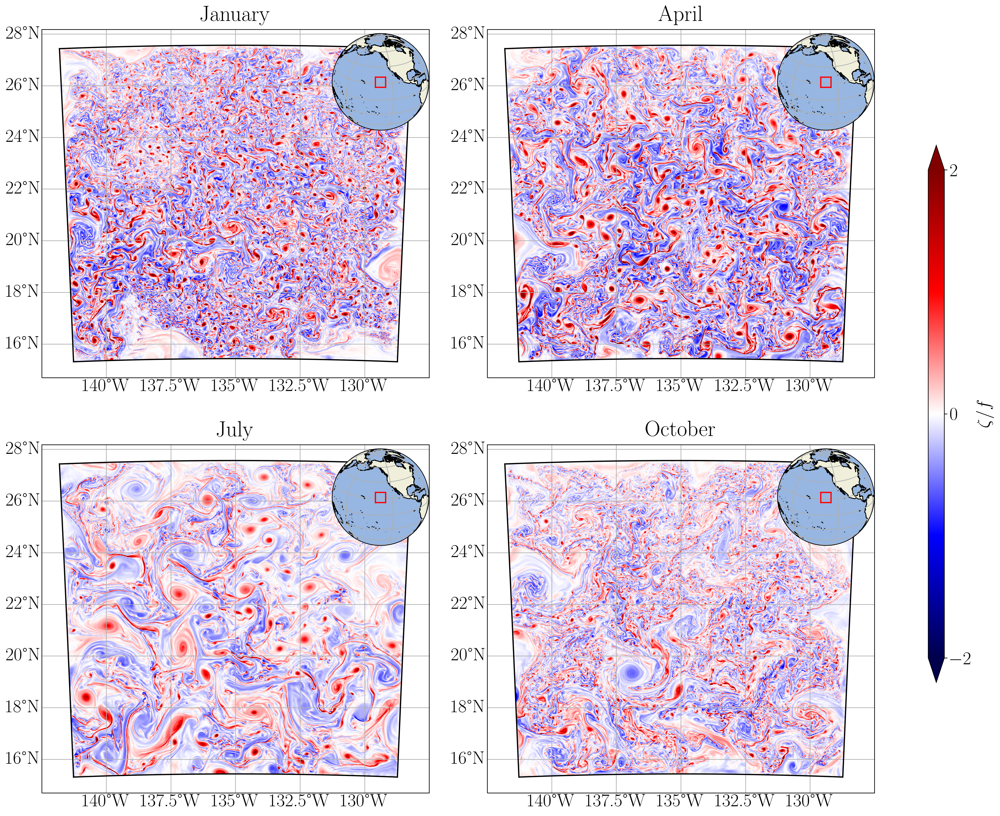

In [52]:
######## VARIABLES USED IN THIS PLOT ############
surfzeta = ds.xroms.to_grid('vort', 'rho', 's_w').isel(s_w=-2)


########      PLOT FORMATTING     ############
pvllim = 0
pvhlim = 1.5

########      DEFINE THE FIGURE   ############
fig = plt.figure(figsize=(18,18), dpi=300)
gs = gridspec.GridSpec(2,2, figure=fig, height_ratios=[1,1])

toff = 0
month = [1, 4, 7, 10]
titles = ['January', 'April', 'July', 'October']
for i in range(0,4):
    ts = np.argmin(np.abs(ds.yearday.values -((month[i]-1)+0.5)*30)) 
    #uf    = Forder(dsmshark.u[ts,-3:,:,:])
    #vf    = Forder(dsmshark.v[ts,-3:,:,:])
    #ZETA = tools.get_vrt(uf, vf, z_r[:,:,-3:], z_w[:,:,-4:], msharkgrid.pm.values,msharkgrid.pn.values)
    ZETA = surfzeta.isel(ocean_time=ts)[1:-1,1:-1]
    axz = plt.subplot(gs[i], projection=ccrs.PlateCarree())
 

    # zeta plot
    im = axz.pcolormesh(ds.lon_psi.values, ds.lat_psi.values, ZETA/ds.f[1:-1,1:-1], vmin=-2, vmax=2, cmap='seismic')
    #plt.colorbar(im, ax=axz)
    #axz.axhline(msharkgrid.lat_psi.values[ei,0])
    #axz.axvline(msharkgrid.lon_psi.values[0,xi])
    gl = axz.gridlines(draw_labels=True)

    gl.xlabels_top = False
    gl.ylabels_right = False
    gl.xlocator = mticker.FixedLocator([-145, -142.5, -140, -137.5, -135, -132.5, -130,-127.5, -125])
    axz.set_xticklabels(['','','-140', '','-135','','-130','',''])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    axz.add_feature(cfeature.OCEAN, facecolor='1')
    axz.set_title(titles[i])
    #fig.subplots_adjust(right=0.95)
    #cbar_ax = fig.add_axes([0.8, 0.35, 0.02, 0.5])
    #cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[-2, 0, 2])
    #cb.set_label('$\zeta /f$')


    # ADD MAP TO ZETA PLOT
    ax = inset_axes(axz, width="25%", height="30%", loc=1, borderpad=0.01, axes_class=cartopy.mpl.geoaxes.GeoAxes,
                    axes_kwargs={'facecolor':'lightgrey', 'map_projection':ccrs.Orthographic(-135, 22)})

    #ax = fig.add_subplot(cbaxes, subplot_kw={'projection': ccrs.PlateCarree()})

    #ax.pcolormesh(longrid, latgrid, np.transpose(sst), cmap=cmap, vmin = tliml, vmax=tlimh, transform = ccrs.PlateCarree())

    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor='black')
#
    ax.set_global()
    ax.gridlines()



    tf = ccrs.Geodetic()
    ax.plot(ds.lon_rho[-1,:], ds.lat_rho[-1,:],
             color='r', linestyle='-',
             transform=tf,
             ) # TOP

    ax.plot(ds.lon_rho[0,:], ds.lat_rho[0,:],
             color='r', linestyle='-',
             transform=tf,
             ) # BOTTOM

    ax.plot(ds.lon_rho[:,0], ds.lat_rho[:,0],
             color='r', linestyle='-',
             transform=tf,
             ) # LEFT

    ax.plot(ds.lon_rho[:,-1], ds.lat_rho[:,-1],
             color='r', linestyle='-',
             transform=tf,
             ) # RIGHT

    axz.plot(ds.lon_rho[-1,:], ds.lat_rho[-1,:],
             color='k', linestyle='-',
             transform=tf,
             ) # TOP

    axz.plot(ds.lon_rho[0,:], ds.lat_rho[0,:],
             color='k', linestyle='-',
             transform=tf,
             ) # BOTTOM

    axz.plot(ds.lon_rho[:,0], ds.lat_rho[:,0],
             color='k', linestyle='-',
             transform=tf,
             ) # LEFT

    axz.plot(ds.lon_rho[:,-1], ds.lat_rho[:,-1],
             color='k', linestyle='-',
             transform=tf,
             ) # RIGHT

    
cbar_ax = fig.add_axes([0.95, 0.25, 0.015, 0.5])
cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[-2, 0, 2])
cb.set_label(r'$\zeta/f$')
plt.subplots_adjust(wspace=0.15, hspace=0.05)
#plt.savefig('AnnualZeta.ps', bbox_inches='tight')

## MODE WATER EDDY SLICE

/homes/metofac/wenegrat/miniconda3/envs/WHITESHARK/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/homes/metofac/wenegrat/miniconda3/envs/WHITESHARK/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
<ipython-input-113-9d2404c6b32a>:44: UserWarning: FixedFormatter should only be used together with FixedLocator
  axz.set_xticklabels(['','','-140', '','-135','','-130','',''])
<ipython-input-113-9d2404c6b32a>:76: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest'

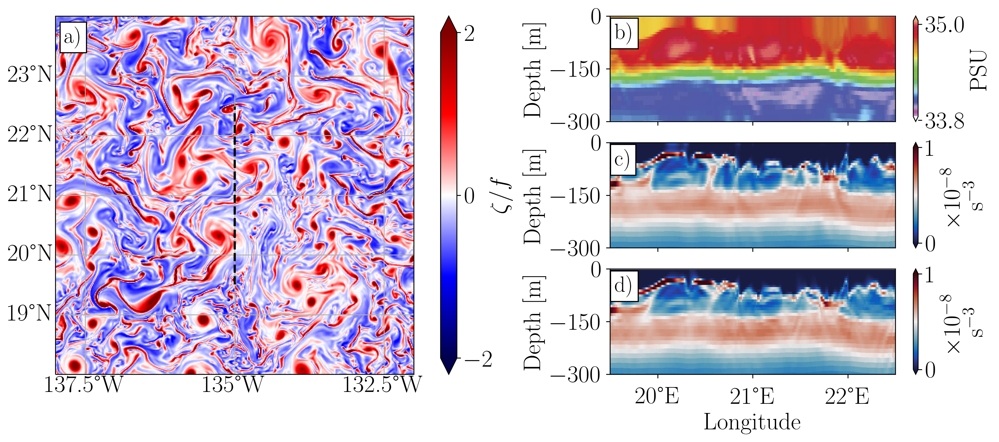

In [113]:
# Pick a timestep
ts = np.argmin(np.abs(ds.yearday.values-(4.625*30)))
ts = np.argmin(np.abs(ds.yearday.values-(3.5*30)))

# Calculate plot variables
ZETA = ds.xroms.to_grid('vort', 'rho', 's_w').isel(s_w=-2, ocean_time=ts)[1:-1,1:-1]
PV = ds.xroms.ertel.isel(ocean_time=ts)
dbdz = xroms.to_grid(xroms.ddz(ds.xroms.buoyancy,grid, sboundary='fill', sfill_value=np.nan),grid, scoord='s_rho')
PPV = ds.f*dbdz.isel(ocean_time=ts)


# ZETA, SALT, PV, and pPV plot
#ei=np.argmin(np.abs(msharkgrid.lat_psi.values[:,100] - 19.55))
#ei=np.argmin(np.abs(msharkgrid.lat_psi.values[:,100] - 22.5))
xi=np.argmin(np.abs(ds.lon_psi.values[100,:] +135.25))
xi=np.argmin(np.abs(ds.lon_psi.values[100,:] +135.))

# 1) Pick a time in April
# 2) Add an upper plot showing surface vorticity and section line
# 3) Hunt for correct position/time.

pvllim = 0
pvhlim = 1.
bmap = cm.cm.balance
#Define Figure
fig = plt.figure(figsize=(16,6), dpi=300)
gs = gridspec.GridSpec(3,2, figure=fig, width_ratios=[1.5,1])
axz = plt.subplot(gs[:, 0], projection=ccrs.PlateCarree())
axq = plt.subplot(gs[1, 1])
axf = plt.subplot(gs[2, 1])
axs = plt.subplot(gs[0, 1])

# zeta plot
im = axz.pcolormesh(ds.lon_psi.values, ds.lat_psi.values, ZETA/ds.f[1:-1,1:-1], 
                    vmin=-2, vmax=2, cmap='seismic')
#plt.colorbar(im, ax=axz)
#axz.axhline(msharkgrid.lat_psi.values[ei,0])
#axz.axvline(msharkgrid.lon_psi.values[0,xi])
gl = axz.gridlines(draw_labels=True)

gl.xlabels_top = False
gl.ylabels_right = False
gl.xlocator = mticker.FixedLocator([-145, -142.5, -140, -137.5, -135, -132.5, -130,-127.5, -125])
axz.set_xticklabels(['','','-140', '','-135','','-130','',''])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
axz.add_feature(cfeature.OCEAN, facecolor='1')
zlatl = 19.5
zlatr = 25.5
zlatl = 18
zlatr = 24
zlonl = -138.
zlonr = -132.
axz.set_xlim(zlonl, zlonr)
axz.set_ylim(zlatl, zlatr)

axz.text( zlonl+0.15, zlatr-0.45 ,'a)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

##fig.subplots_adjust(right=0.95)
#cbar_ax = fig.add_axes([0.8, 0.35, 0.02, 0.5])
cb = plt.colorbar(im, ax=axz, extend='both', ticks=[-2, 0, 2])
#cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[-2, 0, 2])
cb.set_label('$\zeta /f$', labelpad=-5)

#SALT plot
xi = 450
xl = 20.5
xr = 22.5
xl = 19.5
xr = 22.5
slow = 33.75
shigh = 35.25
slow = 33.8444
shigh = 35.0410
#im = axs.pcolormesh(msharkgrid.lon_rho.values[ei,:], z_w[ei,1,:],np.transpose(saltf[ei,:,:]*1e8),  cmap='inferno')
im = axs.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=ts)[:,1,:],ds.salt.isel(ocean_time=ts)[:,:,xi], vmin=slow, vmax=shigh, cmap=smap)

axs.set_ylim(-300,0)
axs.set_yticks([-300, -150, 0])
axs.set_ylabel('Depth [m]')
axs.xaxis.set_major_formatter(LATITUDE_FORMATTER)
axs.set_xticklabels([])
axs.text( xl+0.05, -65 ,'b)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

cb = plt.colorbar(im, ax=axs, extend='both', ticks = [round(slow,1), round(shigh,1)])
cb.set_label('PSU')

#axq.axvline(msharkgrid.lon_psi.values[ei,xi])
#xl = -137.5
#xr = -134
#xl = -137
#xr = -133
axs.set_xlim(xl, xr)


#pv plot

#im = axq.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_w[ei,1,:],np.transpose( PV[ei,:,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap='inferno')
im = axq.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=ts)[:,1,:],PV[:,:,xi]*1e8, vmin=pvllim, vmax=pvhlim, cmap=bmap)
axq.set_ylim(-300,0)
axq.set_yticks([-300, -150, 0])
axq.set_ylabel('Depth [m]')
axq.xaxis.set_major_formatter(LATITUDE_FORMATTER)
axq.set_xticklabels([])
axq.set_xlim(xl, xr)
axq.text( xl+0.05, -65 ,'c)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

cb = plt.colorbar(im, ax=axq, extend='both', ticks = [pvllim, pvhlim])
cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')

#xli = np.argmin(np.abs(msharkgrid.lon_psi.values[ei,:] - xl))
#xri = np.argmin(np.abs(msharkgrid.lon_psi.values[ei,:] - xr))
#axz.plot(msharkgrid.lon_psi[ei,xli:xri], msharkgrid.lat_psi[ei,xli:xri], color='k', linestyle='--', linewidth=2)
xli = np.argmin(np.abs(ds.lat_psi.values[:,xi] - xl))
xri = np.argmin(np.abs(ds.lat_psi.values[:,xi] - xr))
axz.plot(ds.lon_psi[xli:xri, xi], ds.lat_psi[xli:xri, xi], color='k', linestyle='--', linewidth=2)


#planetary pv plot
#im = axf.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_r[ei,1,:],np.transpose( pPV[ei,:,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap='inferno')
im = axf.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=ts)[:,1,:],PPV[:,xi,:].T*1e8, vmin=pvllim, vmax=pvhlim, cmap=bmap)

axf.set_ylim(-300,0)
axf.set_yticks([-300, -150, 0])
#axf.set_yticklabels([])
axf.set_ylabel('Depth [m]')

#axf.axvline(msharkgrid.lon_psi.values[ei,xi])
axf.text( xl+0.05, -65 ,'d)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

axf.set_xlim(xl, xr)
axf.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
axf.set_xlabel('Longitude')
axf.tick_params(axis='x', which='major', pad=8)
cb = plt.colorbar(im, ax=axf, extend='both', ticks = [pvllim, pvhlim])
cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')

#cbar_ax = fig.add_axes([0.95, 0.12, 0.015, 0.14])
#cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[pvllim, pvhlim])
#cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')
##pv plot slice lat
#im = axf.pcolormesh(msharkgrid.lat_psi.values[:,xi], z_w[1,xi,:],np.transpose( PV[:,xi,:]), vmin=pvllim, vmax=pvhlim)
#axf.set_ylim(-500,0)

#axf.axvline(msharkgrid.lat_psi.values[ei,xi])

#planetary pv plot
#axf.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_r[ei,1,:],np.transpose( pPV[ei,:,:]), vmin=pvllim, vmax=pvhlim)
#axf.set_ylim(-500,0)
#plt.colorbar(im, ax=axf)

<ipython-input-111-27bc02e58808>:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=ts)[:,1,:],PPV[:,xi,:].T*1e8, vmin=pvllim, vmax=pvhlim, cmap=bmap)
<ipython-input-111-27bc02e58808>:9: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=ts)[:,1,:],ds.salt.isel(ocean_time=ts)[:,:,xi], vmin=slow, vmax=shigh, cmap=smap)


(-400.0, 0.0)

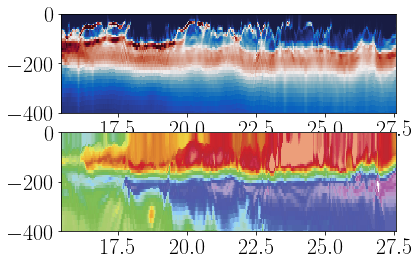

In [111]:
# For quick exploration of which slice to use
xi=np.argmin(np.abs(ds.lon_psi.values[100,:] +135.))

ax = plt.subplot(211)
ax.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=ts)[:,1,:],PPV[:,xi,:].T*1e8, vmin=pvllim, vmax=pvhlim, cmap=bmap)
ax.set_ylim(-400,0)

ax = plt.subplot(212)
ax.pcolormesh(ds.lat_rho.values[:,xi], ds.z_rho.isel(ocean_time=ts)[:,1,:],ds.salt.isel(ocean_time=ts)[:,:,xi], vmin=slow, vmax=shigh, cmap=smap)
ax.set_ylim(-400,0)

## TESTING

[########################################] | 100% Completed |  1.2s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  1.2s


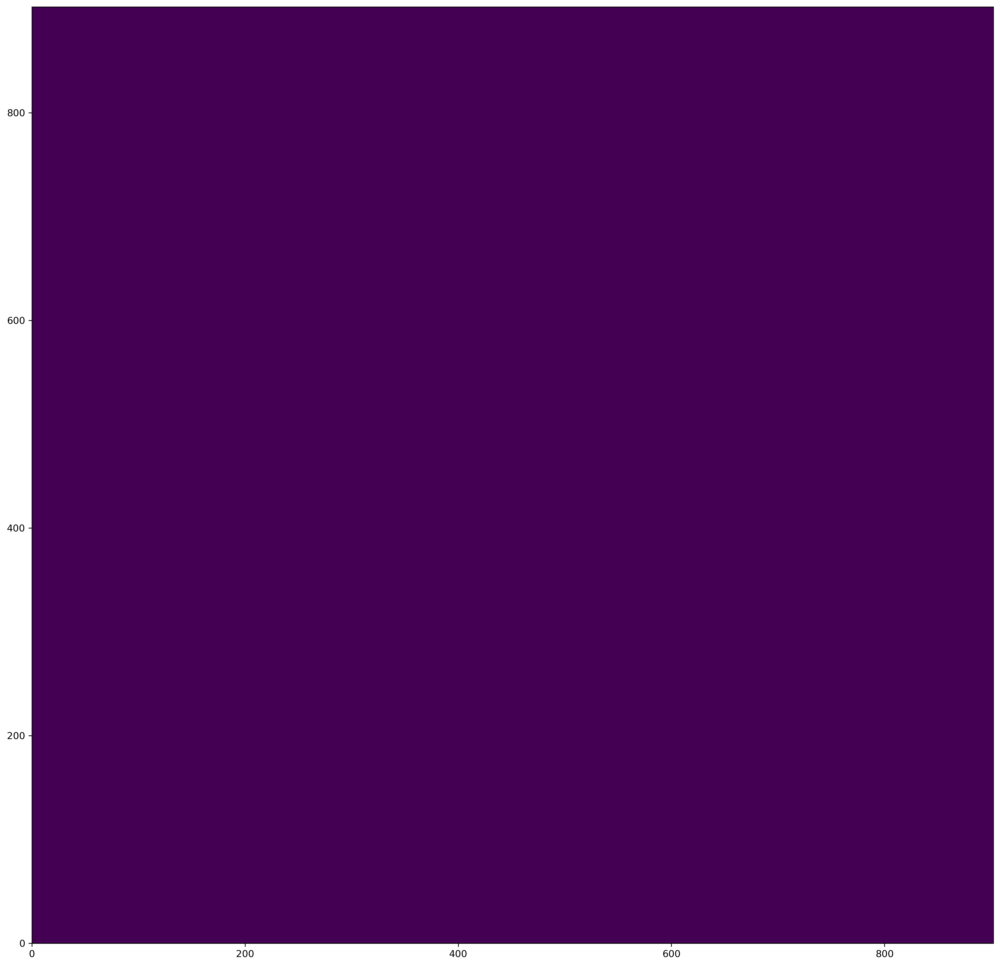

In [7]:
with ProgressBar():
    surfzeta = ds.xroms.to_grid('vort', 'rho', 's_w').isel(s_w=-1)

    #Define Figure
    fig = plt.figure(figsize=(18,18), dpi=300)
    gs = gridspec.GridSpec(2,2, figure=fig, height_ratios=[1,1])


    month = [1, 4, 7, 10]
    titles = ['January', 'April', 'July', 'October']
    i = 0
    ts = np.argmin(np.abs(ds.yearday.values -((month[i]-1)+0.5)*30)) 
        #uf    = Forder(dsmshark.u[ts,-3:,:,:])
        #vf    = Forder(dsmshark.v[ts,-3:,:,:])
        #ZETA = tools.get_vrt(uf, vf, z_r[:,:,-3:], z_w[:,:,-4:], msharkgrid.pm.values,msharkgrid.pn.values)
    ZETA = surfzeta.isel(ocean_time=ts)
    plt.pcolor(ZETA/ds.f)

In [13]:
ds.lat_rho.values

array([[15.312803, 15.313342, 15.31388 , ..., 15.31388 , 15.313342,
        15.312803],
       [15.326206, 15.326745, 15.327283, ..., 15.327283, 15.326745,
        15.326206],
       [15.33961 , 15.340149, 15.340687, ..., 15.340687, 15.340149,
        15.33961 ],
       ...,
       [27.40642 , 27.407005, 27.407589, ..., 27.407589, 27.407005,
        27.40642 ],
       [27.41982 , 27.420406, 27.42099 , ..., 27.42099 , 27.420406,
        27.41982 ],
       [27.433222, 27.433807, 27.434391, ..., 27.434391, 27.433807,
        27.433222]], dtype=float32)

In [60]:
ds.salt.isel(ocean_time=ts)

<xarray.DataArray 'salt' (s_rho: 80, eta_rho: 902, xi_rho: 902)>
dask.array<getitem, shape=(80, 902, 902), dtype=float32, chunksize=(10, 902, 902), chunktype=numpy.ndarray>
Coordinates:
  * eta_rho     (eta_rho) int64 0 1 2 3 4 5 6 7 ... 895 896 897 898 899 900 901
  * s_rho       (s_rho) float64 -0.9937 -0.9812 -0.9688 ... -0.01875 -0.00625
  * xi_rho      (xi_rho) int64 0 1 2 3 4 5 6 7 ... 895 896 897 898 899 900 901
    lon_rho     (eta_rho, xi_rho) float32 dask.array<chunksize=(902, 902), meta=np.ndarray>
    lat_rho     (eta_rho, xi_rho) float32 dask.array<chunksize=(902, 902), meta=np.ndarray>
    ocean_time  float64 2.919e+08
    z_rho       (s_rho, eta_rho, xi_rho) float64 dask.array<chunksize=(10, 902, 902), meta=np.ndarray>
    z_rho0      (s_rho, eta_rho, xi_rho) float64 dask.array<chunksize=(10, 902, 902), meta=np.ndarray>
Attributes:
    long_name:      salinity
    units:          PSU
    field:          salinity, scalar, series
    standard_name:  sea_water_salinity
    grid:           <xgcm.Grid>\nX Axis (not periodic, boundary=None):\n  * c...

In [90]:
xroms.to_grid(xroms.ddz(ds.xroms.buoyancy,grid, sboundary='fill', sfill_value=np.nan),grid, scoord='s_rho')

,Array,Chunk
Bytes,187.45 GB,52.07 MB
Shape,"(360, 80, 902, 902)","(1, 8, 902, 902)"
Count,514124 Tasks,8640 Chunks
Type,float64,numpy.ndarray
